# Geospatial Analysis of Brazilian E-Commerce
Questo dataset contiene circa 100.000 ordini fatti tra il 2016 ed il 2018. Ogni ordine contiene informazioni riguardanti i customer e posseggono il prime 3 cifre del *zip code* brasiliano (detto anche *CEP*).

## CEP: Brazilian Zip Code
Coincide con l'indirizzo postale nostro. Esso contiene 8 cifre in formato 'nnnnn-nnn'.
Si noti la presenza del separatore '-'.

Originariamente esso avevo solo le prime 5 cifre, successivamente è stato ampliato con ulteriori 3 cifre nel 1992. 

Alcune considerazioni utili:
* Le città con circa 100.000 abitanti posseggono un *CEP* assegnato ad ogni posto pubblico e per alcuni spazi privati ad alta occupazione, come grossi centri commerciali e grandi condomini residenziali.
* Le città piccole invece hanno le ultime 3 cifre codificate con 000.



In [3]:
import numpy as np
import pandas as pd
import os

path = 'C:/Users/dmaiorano/OneDrive - Jakala SpA/Desktop/Data Science with Python/Brasil geolocalization market/olist_geolocation_dataset.csv'
geo = pd.read_csv(path, dtype={'geolocation_zip_code_prefix': str})

geo.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,01037,-23.545621,-46.639292,sao paulo,SP
1,01046,-23.546081,-46.644820,sao paulo,SP
2,01046,-23.546129,-46.642951,sao paulo,SP
3,01041,-23.544392,-46.639499,sao paulo,SP
4,01035,-23.541578,-46.641607,sao paulo,SP


Creiamo delle variabili nuove che vanno a scomporre il *geolocalization_zip_code_prefix* in pezzi.

In [4]:
geo['geolocation_zip_code_prefix_1_digits'] = geo['geolocation_zip_code_prefix'].str[0:1]
geo['geolocation_zip_code_prefix_2_digits'] = geo['geolocation_zip_code_prefix'].str[0:2]
geo['geolocation_zip_code_prefix_3_digits'] = geo['geolocation_zip_code_prefix'].str[0:3]
geo['geolocation_zip_code_prefix_4_digits'] = geo['geolocation_zip_code_prefix'].str[0:4]
geo.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_3_digits,geolocation_zip_code_prefix_4_digits
0,01037,-23.545621,-46.639292,sao paulo,SP,0,01,010,0103
1,01046,-23.546081,-46.644820,sao paulo,SP,0,01,010,0104
2,01046,-23.546129,-46.642951,sao paulo,SP,0,01,010,0104


Possiamo notare che le 4 nuove variabili vengono aggiunte a destra.

Esploriamo brevemente quanti zipcode abbiamo qua dentro.

In [5]:
geo['geolocation_zip_code_prefix'].value_counts().to_frame().describe() #19015 codici diversi

,geolocation_zip_code_prefix
count,19015.000000
mean,52.598633
std,72.057907
min,1.000000
25%,10.000000
50%,29.000000
75%,66.500000
max,1146.000000


Alcune considerazioni sulle coordinate. La regione di interesse è il Brasile, e le sue coordiante geografiche sono definite entro i seguenti limiti:
* Il punto più a Nord possibile è di 5°, 16' e 27.8'' di latitudine;
* Il punto più a Ovest possibile è di 73°, 58' e 58.19'' di longitudine;
* Il punto più a Sud possibile è di 33°, 45' e 4.21'' secondi di latitudine;
* Il punto più a Est possibile è di 34°, 47' e 35.33'' di longitudine;

E' possibile convertire le misure in °,','' in un valore numerico per longitudine e latitudine, che utilizziamo per rimuovere eventuali outlier (che sarebbero punti sulla mappa esterni al perimetro del Brasile).

In [6]:
geo = geo[geo.geolocation_lat <= 5.27438888] # Nord
geo = geo[geo.geolocation_lng >= -73.98283055] # Ovest
geo = geo[geo.geolocation_lat >= -33.75116944] # Sud
geo = geo[geo.geolocation_lng <=  -34.79314722] # Est

Infine creiamo due nuove variabili *x* e *y* che convertono il sistema di coordinate presenti nel databse in un sistema *Mercator x/y*.

In [7]:
# conda install datashader
from datashader.utils import lnglat_to_meters as webm
x, y = webm(geo.geolocation_lng, geo.geolocation_lat)
geo['x'] = pd.Series(x)
geo['y'] = pd.Series(y)

In [8]:
geo.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_3_digits,geolocation_zip_code_prefix_4_digits,x,y
0,01037,-23.545621,-46.639292,sao paulo,SP,0,01,010,0103,-5.191862e+06,-2.698137e+06
1,01046,-23.546081,-46.644820,sao paulo,SP,0,01,010,0104,-5.192478e+06,-2.698193e+06
2,01046,-23.546129,-46.642951,sao paulo,SP,0,01,010,0104,-5.192270e+06,-2.698199e+06
3,01041,-23.544392,-46.639499,sao paulo,SP,0,01,010,0104,-5.191885e+06,-2.697988e+06
4,01035,-23.541578,-46.641607,sao paulo,SP,0,01,010,0103,-5.192120e+06,-2.697646e+06


# Zip Codes in Brazil
Possiamo quindi plottare i nostri punti su una mappa. Però prima è necessario passare le coordinate a dtype *int* per poterli portare su una mappa.

In [9]:
geo['geolocation_zip_code_prefix'] = geo['geolocation_zip_code_prefix'].astype(int)
geo['geolocation_zip_code_prefix_1_digits'] = geo['geolocation_zip_code_prefix_1_digits'].astype(int)
geo['geolocation_zip_code_prefix_2_digits'] = geo['geolocation_zip_code_prefix_2_digits'].astype(int)
geo['geolocation_zip_code_prefix_3_digits'] = geo['geolocation_zip_code_prefix_3_digits'].astype(int)
geo['geolocation_zip_code_prefix_4_digits'] = geo['geolocation_zip_code_prefix_4_digits'].astype(int)

In [10]:
brazil = geo
agg_name = 'geolocation_zip_code_prefix'
brazil[agg_name].describe().to_frame()

,geolocation_zip_code_prefix
count,1.000121e+06
mean,3.657332e+04
std,3.054939e+04
min,1.001000e+03
25%,1.107500e+04
50%,2.653000e+04
75%,6.350400e+04
max,9.999000e+04


Avremo bisogno di alcune librerie per poter disegnare la nostra mappa: *holoviews* e *geoviews* insieme a *datashader*.

Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
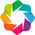

In [11]:
# plot wtih holoviews + datashader - bokeh with map background
import holoviews as hv
import geoviews as gv
import datashader as ds
from colorcet import fire, rainbow, bgy, bjy, bkr, kb, kr
from datashader.colors import colormap_select, Greys9
from holoviews.streams import RangeXY
from holoviews.operation.datashader import datashade, dynspread, rasterize
from bokeh.io import push_notebook, show, output_notebook
output_notebook()
hv.extension('bokeh')

%opts Overlay [width=800 height=600 toolbar='above' xaxis=None yaxis=None]
%opts QuadMesh [tools=['hover'] colorbar=True] (alpha=0 hover_alpha=0.2)

T = 0.05
PX = 1

def plot_map(data, label, agg_data, agg_name, cmap):
    url="http://server.arcgisonline.com/ArcGIS/rest/services/Canvas/World_Dark_Gray_Base/MapServer/tile/{Z}/{Y}/{X}.png"
    geomap = gv.WMTS(url)
    points = hv.Points(gv.Dataset(data, kdims=['x', 'y'], vdims=[agg_name]))
    agg = datashade(points, element_type=gv.Image, aggregator=agg_data, cmap=cmap)
    zip_codes = dynspread(agg, threshold=T, max_px=PX)
    hover = hv.util.Dynamic(rasterize(points, aggregator=agg_data, width=50, height=25, streams=[RangeXY]), operation=hv.QuadMesh)
    hover = hover.options(cmap=cmap)
    img = geomap * zip_codes * hover
    img = img.relabel(label)
    return img

In [12]:
plot_map(brazil, 'Zip Codes in Brazil', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

Un'altro modo di creare una mappa utilizzando *datashader* eliminando i confini statali che vediamo nella mappa precedente (*blank background*)

In [13]:
# plot wtih datashader - image with black background
import datashader as ds
from datashader import transfer_functions as tf
from functools import partial
from datashader.utils import export_image
from IPython.core.display import HTML, display
from colorcet import fire, rainbow, bgy, bjy, bkr, kb, kr

background = "black"
cm = partial(colormap_select, reverse=(background!="black"))
export = partial(export_image, background = background, export_path="export")
display(HTML("<style>.container { width:100% !important; }</style>"))
W = 700 

def create_map(data, cmap, data_agg, export_name='img'):
    pad = (data.x.max() - data.x.min())/50
    x_range, y_range = ((data.x.min() - pad, data.x.max() + pad), 
                             (data.y.min() - pad, data.y.max() + pad))

    ratio = (y_range[1] - y_range[0]) / (x_range[1] - x_range[0])

    plot_width  = int(W)
    plot_height = int(plot_width * ratio)
    if ratio > 1.5:
        plot_height = 550
        plot_width = int(plot_height / ratio)
        
    cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)

    agg = cvs.points(data, 'x', 'y', data_agg)
    img = tf.shade(agg, cmap=cmap, how='eq_hist')
    return export(img, export_name)

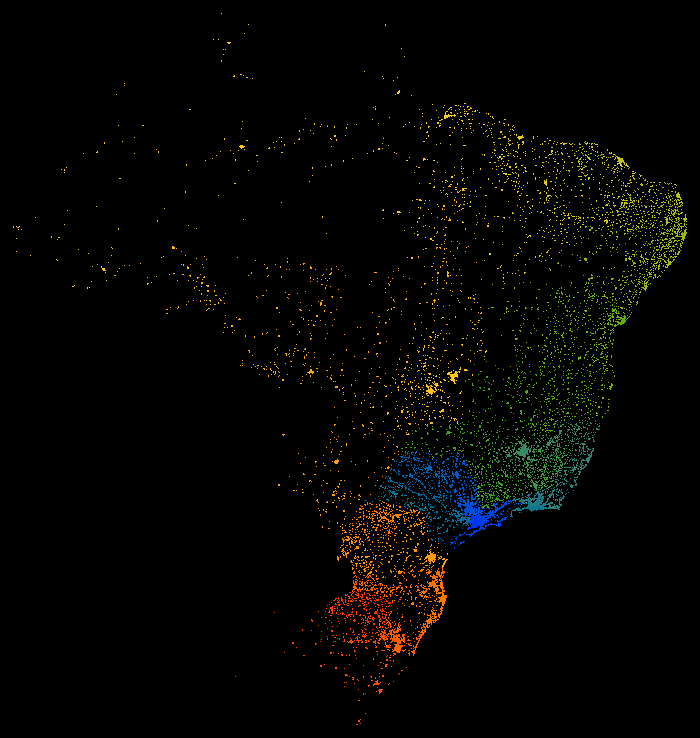

In [14]:
create_map(brazil, rainbow, ds.mean(agg_name),'brazil_zip_codes')

# Zip Codes in States
Concentriamoci sullo stato di *San Paulo* (SP) per vedere come siano fatti i Zip Code in questa regione. Possiamo notare che:
* zip code di San Paulo hanno un range compreso tra 01001 e 19990;
* zip code che iniziano con 0 sono riferiti a zone metropolitane di San Paulo;
* zip code che iniziano con 1 sono interni allo stato; 

In [15]:
def filter_data(level, name):
    df = geo[geo[level] == name]
    # rimuoviamo gli otliers
    df = df[(df.x <= df.x.quantile(0.999)) & (df.x >= df.x.quantile(0.001))]
    df = df[(df.y <= df.y.quantile(0.999)) & (df.y >= df.y.quantile(0.001))]
    return df

In [16]:
sp = filter_data('geolocation_state', 'SP')
agg_name = 'geolocation_zip_code_prefix'
sp[agg_name].describe().to_frame()

,geolocation_zip_code_prefix
count,402651.000000
mean,9030.831782
std,5101.941134
min,1001.000000
25%,4661.000000
50%,8257.000000
75%,13330.000000
max,19990.000000


In [17]:
plot_map(sp, 'Zip Codes in Sao Paulo State', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

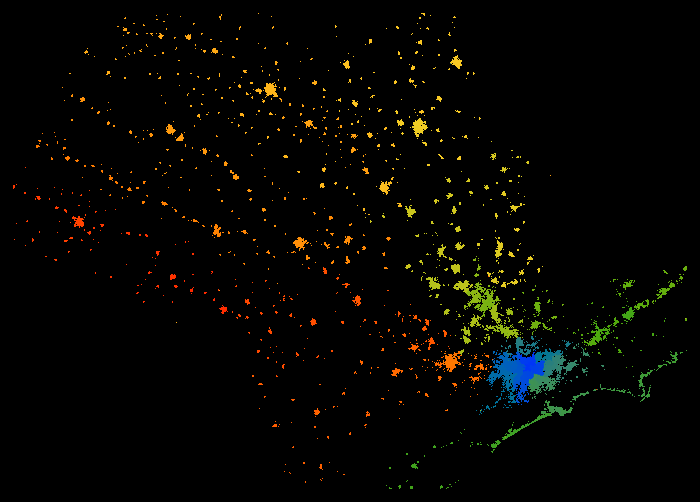

In [18]:
create_map(sp, rainbow, ds.mean(agg_name), 'sp_zip_codes')

# Zip Codes in Large Cities
Concentriamoci ora sulla città di Sao Paulo. Possiamo notare che:
* zip code della città Sao Paulo hanno range tra 01001 a 09540;
* zip code sono in qualche modo legati con le città minori vicine o ai distretti della città

In [19]:
saopaulo = filter_data('geolocation_city', 'sao paulo')
agg_name = 'geolocation_zip_code_prefix'
saopaulo[agg_name].describe().to_frame()

,geolocation_zip_code_prefix
count,135256.000000
mean,4137.454996
std,1804.189554
min,1001.000000
25%,2941.000000
50%,4166.000000
75%,5158.000000
max,9540.000000


In [20]:
plot_map(saopaulo, 'Zip Codes in Sao Paulo City', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

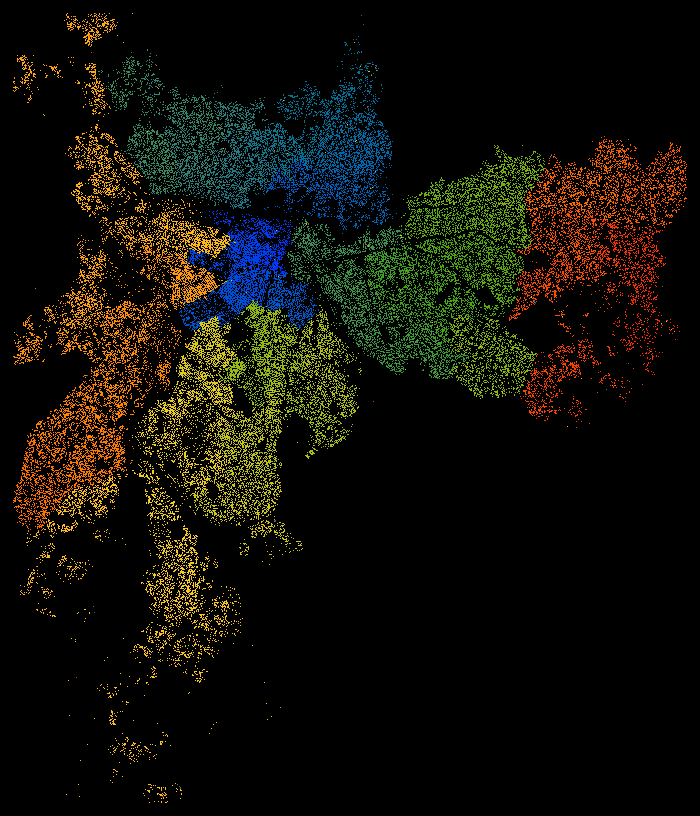

In [21]:
create_map(saopaulo, rainbow, ds.mean(agg_name),'sao_paulo_zip_codes')

# Zip Codes in Small Cities
Concentriamoci sulla piccola città di *Atibaia*. Possiamo notare che:
* Zip Code prefix di *Atibaia* è compreso tra 12940 e 12954;
* Esistono delle città adiacienti con lo stesso zip code;
* Per vedere meglio nel dettaglio le posizioni dei record, avremo bisogno di guardare attentamente la quarta e la quinta cifra;

In [22]:
atibaia = geo[geo['geolocation_city'] == 'atibaia']
agg_name = 'geolocation_zip_code_prefix'
atibaia[agg_name].describe().to_frame()

,geolocation_zip_code_prefix
count,1254.000000
mean,12945.042265
std,4.197704
min,12940.000000
25%,12942.000000
50%,12944.000000
75%,12948.000000
max,12954.000000


In [23]:
plot_map(atibaia, 'Zip Codes in Atibaia', ds.min(agg_name), agg_name, cmap=rainbow)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y geolocation_zip_code_prefix)

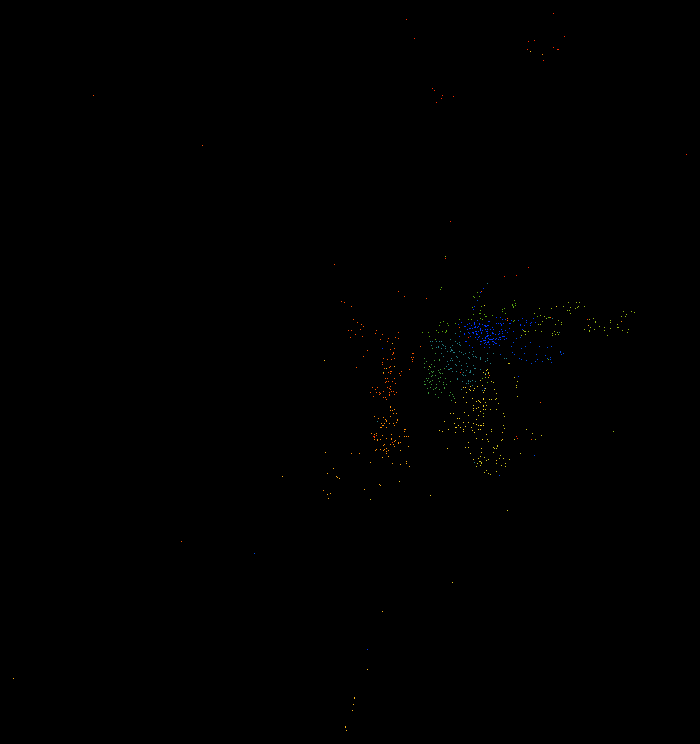

In [24]:
create_map(atibaia, rainbow, ds.mean(agg_name), 'atibaia_zip_codes')

# Zip codes digits meanings
Vediamo che tipo di informazioni possiamo trarre da ogni cifre dello zip code.

**Zip codes che iniziano con 2 sono tutti dagli stati di *Rio De Janeiro* (RJ) e da *Espìrito Santo* (ES)**

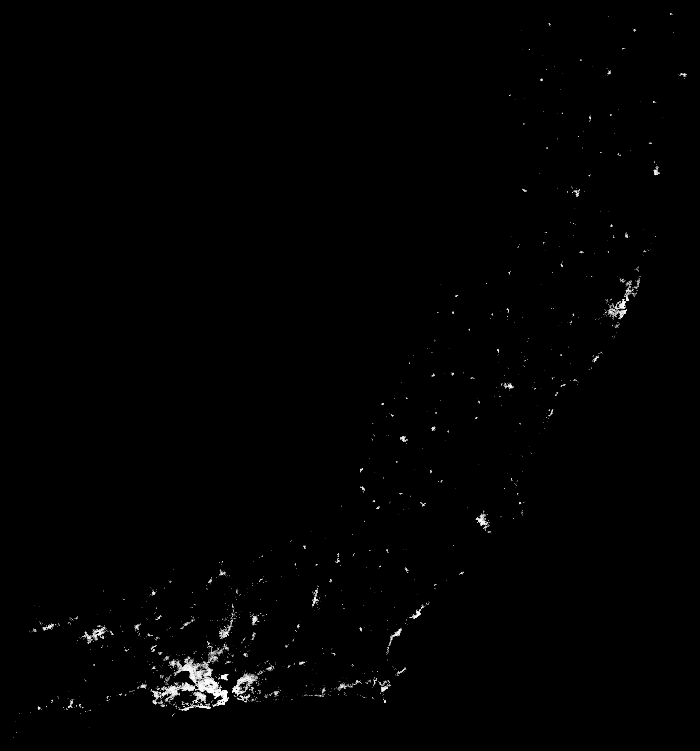

In [25]:
# Zip code: 2
df = filter_data('geolocation_zip_code_prefix_1_digits', 2)
create_map(df, cm(Greys9), ds.count(), 'zip_code_2')

**Zip Code che iniziano con 22 sono tutti dentro l'area della città di *Rio De Janeiro* ma rappresentano anche diverse regioni adiacienti**

Da destra a sinistra osserviamo le città vicine come *Leme*, *Copacabana*, *Ipanema* e *Barra de Tijuca*.

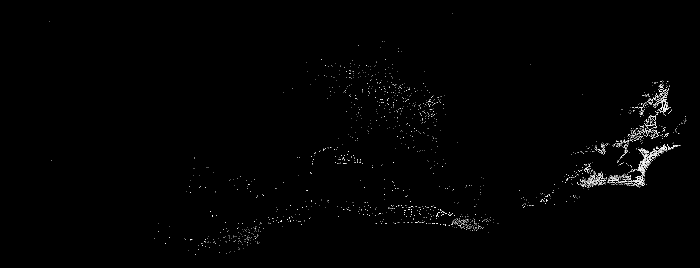

In [26]:
# Zip code: 22
df = filter_data('geolocation_zip_code_prefix_2_digits', 22)
create_map(df, cm(Greys9), ds.count(), 'zip_code_22')

**Zip code che iniziano con 220 sono tutti riferiti alla città di *Copacabana*, che è una vicina di *Rio De Janeiro***

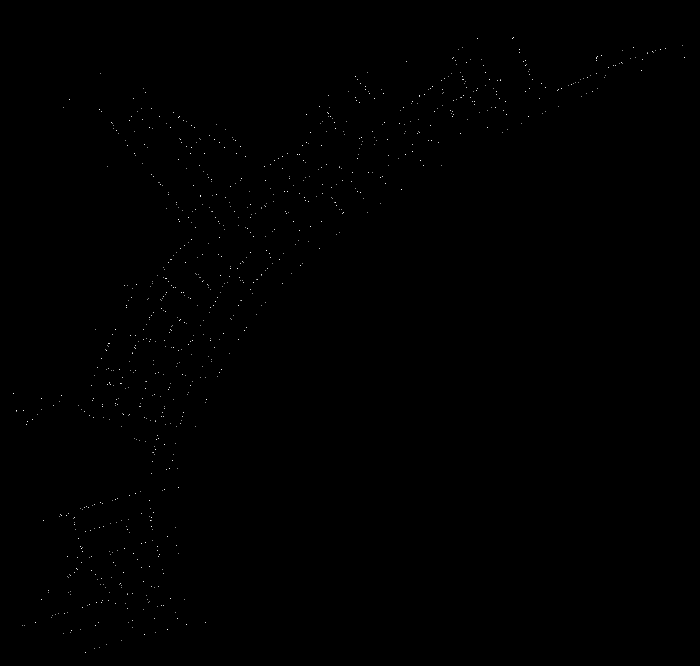

In [27]:
# Zip code: 220
df = filter_data('geolocation_zip_code_prefix_3_digits', 220)
create_map(df, cm(Greys9), ds.count(), 'zip_code_220')

**Zip code che iniziano con 2201 rappresentano alcune strade di *Copacabana***

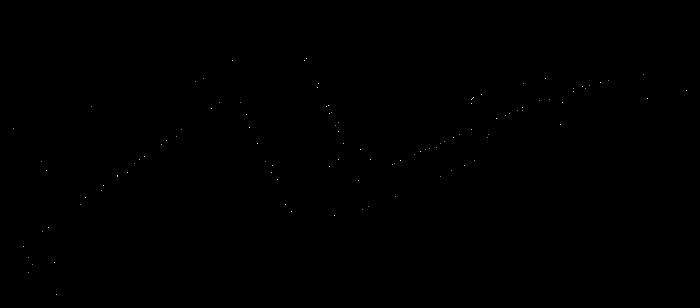

In [28]:
# Zip code: 2201
df = filter_data('geolocation_zip_code_prefix_4_digits', 2201)
create_map(df, cm(Greys9), ds.count(), 'zip_code_2201')

**Zip code che iniziano con 22010 fanno riferimento a strade spicifiche di *Copacabana***

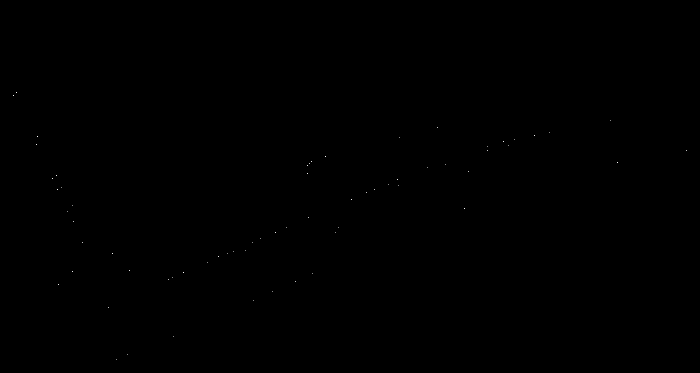

In [29]:
# Zip code: 22010
df = filter_data('geolocation_zip_code_prefix', 22010)
create_map(df, cm(Greys9), ds.count(), 'zip_code_22010')

# Da dove vengono le Revenue maggiori?
Lavorare con 5 cifre di zip code può portarci ad avere campioni di aree troppo piccoli. Pertanto utilizzeremo le prime 3 cifre così da mantenere un sample più omogeneo e utilizzabile.

Plottiamo la somma dei *product value* raggruppando per zip code.

In [30]:
import os
cwd = os.getcwd()

In [31]:
orders_df = pd.read_csv(cwd+'/olist_orders_dataset.csv')
order_items = pd.read_csv(cwd+'/olist_order_items_dataset.csv')
order_reviews = pd.read_csv(cwd+'/olist_order_reviews_dataset.csv')
customer = pd.read_csv(cwd+'/olist_customers_dataset.csv', 
dtype={'customer_zip_code_prefix': str})

# Getting first 3 digits of customer zipcode
customer['customer_zip_code_prefix_3_digits'] = customer['customer_zip_code_prefix'].str[0:3]
customer['customer_zip_code_prefix_3_digits'] = customer['customer_zip_code_prefix_3_digits'].astype(int)

brazil_geo = geo.set_index('geolocation_zip_code_prefix_3_digits').copy()

In [32]:
brazil_geo.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_4_digits,x,y
geolocation_zip_code_prefix_3_digits,,,,,,,,,,
10,1037,-23.545621,-46.639292,sao paulo,SP,0,1,103,-5.191862e+06,-2.698137e+06
10,1046,-23.546081,-46.644820,sao paulo,SP,0,1,104,-5.192478e+06,-2.698193e+06
10,1046,-23.546129,-46.642951,sao paulo,SP,0,1,104,-5.192270e+06,-2.698199e+06
10,1041,-23.544392,-46.639499,sao paulo,SP,0,1,104,-5.191885e+06,-2.697988e+06
10,1035,-23.541578,-46.641607,sao paulo,SP,0,1,103,-5.192120e+06,-2.697646e+06


Uniamo i due dataset *orders_df* e *order_items*. Possiamo farlo dato che i due dataset condividono la variabile chiave *order_id*.

In [33]:
orders = orders_df.merge(order_items, on='order_id')
orders = orders.merge(customer, on='customer_id')
orders = orders.merge(order_reviews, on='order_id')

In [34]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_zip_code_prefix,customer_city,customer_state,customer_zip_code_prefix_3_digits,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,03149,sao paulo,SP,31,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,595fac2a385ac33a80bd5114aec74eb8,...,47813,barreiras,BA,478,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1,aa4383b373c6aca5d8797843e5594415,...,75265,vianopolis,GO,752,e73b67b67587f7644d5bd1a52deb1b01,5,NaN,NaN,2018-08-18 00:00:00,2018-08-22 19:07:58
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,1,d0b61bfb1de832b15ba9d266ca96e5b0,...,59296,sao goncalo do amarante,RN,592,359d03e676b3c069f62cadba8dd3f6e8,5,NaN,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,1,65266b2da20d04dbe00c5c2d3bb7859e,...,09195,santo andre,SP,91,e50934924e227544ba8246aeb3770dd4,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 13:02:51


Vogliamo sapere quanto è stato ordinato (somma di denaro totale speso) per ogni indirizzo a 3 cifre.

In [35]:
gp = orders.groupby('customer_zip_code_prefix_3_digits')['price'].sum().to_frame()
revenue = brazil_geo.join(gp)
agg_name = 'revenue'
revenue[agg_name] = revenue.price/1000


In [36]:
plot_map(revenue, 'Orders Revenue (thousands R$)',
    ds.mean(agg_name), agg_name, cmap=fire)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y revenue)

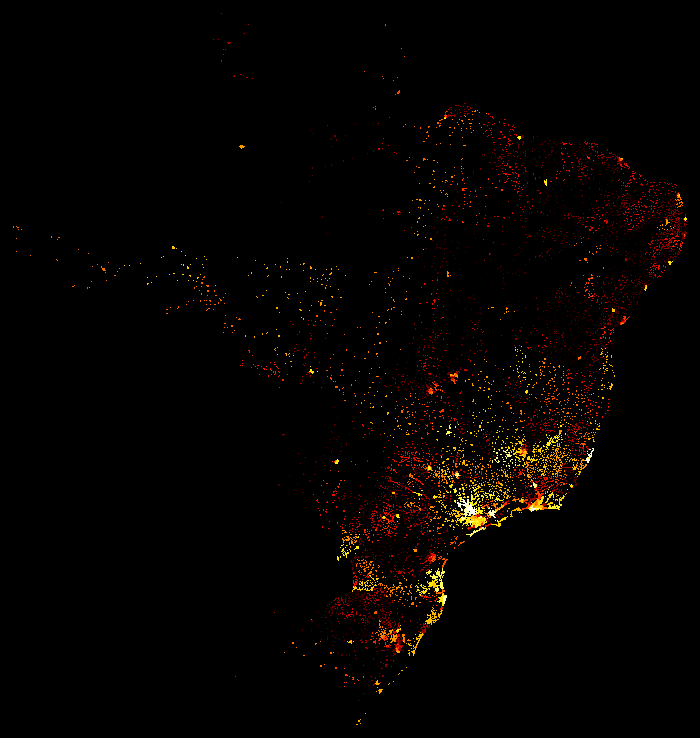

In [37]:
create_map(revenue, fire, ds.mean(agg_name), 'revenue_brazil')

E' possibile notare come le regioni costiere a sud siano quelle che più hanno generato revenue. Ovviamente, come mostrato dalla mappa, le città maggiori e la capitale sono i posti in cui si ha il maggior ricavo.

# Ticket medio
Ci chiediamo quanto sia il ticket medio per ogni regione a 3 digits.

In [38]:
gp = orders.groupby('order_id').agg({'price': 'sum',
    'customer_zip_code_prefix_3_digits': 'max'})
gp = gp.groupby('customer_zip_code_prefix_3_digits')['price'].mean().to_frame()

avg_ticket = brazil_geo.join(gp)
agg_name = 'avg_ticket'
avg_ticket[agg_name] = avg_ticket.price

avg_ticket

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state,geolocation_zip_code_prefix_1_digits,geolocation_zip_code_prefix_2_digits,geolocation_zip_code_prefix_4_digits,x,y,price,avg_ticket
10,1037,-23.545621,-46.639292,sao paulo,SP,0,1,103,-5.191862e+06,-2.698137e+06,161.567181,161.567181
10,1046,-23.546081,-46.644820,sao paulo,SP,0,1,104,-5.192478e+06,-2.698193e+06,161.567181,161.567181
10,1046,-23.546129,-46.642951,sao paulo,SP,0,1,104,-5.192270e+06,-2.698199e+06,161.567181,161.567181
10,1041,-23.544392,-46.639499,sao paulo,SP,0,1,104,-5.191885e+06,-2.697988e+06,161.567181,161.567181
10,1035,-23.541578,-46.641607,sao paulo,SP,0,1,103,-5.192120e+06,-2.697646e+06,161.567181,161.567181
...,...,...,...,...,...,...,...,...,...,...,...,...
999,99950,-28.068639,-52.010705,tapejara,RS,9,99,9995,-5.789805e+06,-3.257630e+06,116.278889,116.278889
999,99900,-27.877125,-52.224882,getulio vargas,RS,9,99,9990,-5.813647e+06,-3.233491e+06,116.278889,116.278889
999,99950,-28.071855,-52.014716,tapejara,RS,9,99,9995,-5.790252e+06,-3.258036e+06,116.278889,116.278889
999,99980,-28.388932,-51.846871,david canabarro,RS,9,99,9998,-5.771567e+06,-3.298098e+06,116.278889,116.278889


In [39]:
plot_map(avg_ticket, 'Orders Average Ticket (R$)', 
    ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y avg_ticket)

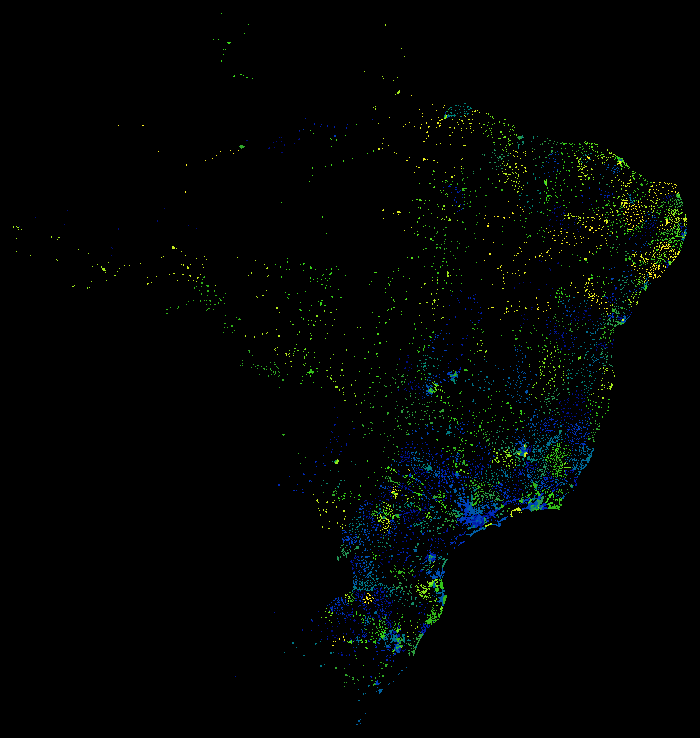

In [40]:
create_map(avg_ticket, bgy, ds.mean('avg_ticket'), 'avg_ticket_brazil')

Chi abita sulle coste/città a sud paga dei ticket medi minori.

# Chi paga di più il trasporto?

In [41]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,...,customer_zip_code_prefix,customer_city,customer_state,customer_zip_code_prefix_3_digits,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00,1,87285b34884572647811a353c7ac498a,...,03149,sao paulo,SP,31,a54f0611adc9ed256b57ede6b6eb5114,4,NaN,"Não testei o produto ainda, mas ele veio corre...",2017-10-11 00:00:00,2017-10-12 03:43:48
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00,1,595fac2a385ac33a80bd5114aec74eb8,...,47813,barreiras,BA,478,8d5266042046a06655c8db133d120ba5,4,Muito boa a loja,Muito bom o produto.,2018-08-08 00:00:00,2018-08-08 18:37:50
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00,1,aa4383b373c6aca5d8797843e5594415,...,75265,vianopolis,GO,752,e73b67b67587f7644d5bd1a52deb1b01,5,NaN,NaN,2018-08-18 00:00:00,2018-08-22 19:07:58
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00,1,d0b61bfb1de832b15ba9d266ca96e5b0,...,59296,sao goncalo do amarante,RN,592,359d03e676b3c069f62cadba8dd3f6e8,5,NaN,O produto foi exatamente o que eu esperava e e...,2017-12-03 00:00:00,2017-12-05 19:21:58
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00,1,65266b2da20d04dbe00c5c2d3bb7859e,...,09195,santo andre,SP,91,e50934924e227544ba8246aeb3770dd4,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 13:02:51


In [42]:
gp = orders.groupby('order_id').agg({'price': 'sum', 'freight_value': 'sum',
    'customer_zip_code_prefix_3_digits': 'max'})
agg_name = 'freight_ratio'
gp[agg_name] = gp.freight_value / gp.price
gp = gp.groupby('customer_zip_code_prefix_3_digits')[agg_name].mean().to_frame()
freight_ratio = brazil_geo.join(gp)

In [43]:
plot_map(freight_ratio, 'Orders Average Freight Ratio', 
    ds.mean(agg_name), agg_name, cmap=bgy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y freight_ratio)

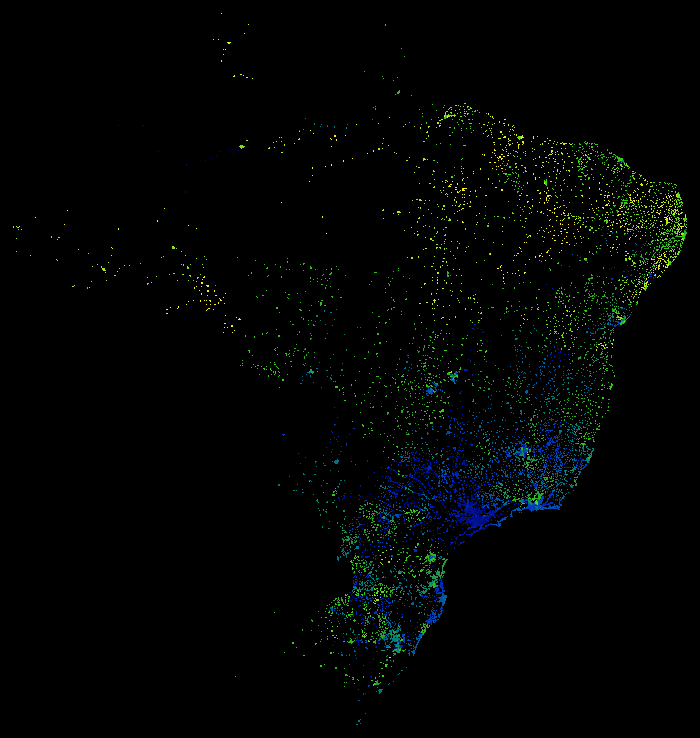

In [44]:
create_map(freight_ratio, bgy, ds.mean('freight_ratio'), 
    'freight_ratio_brazil')

IL *freight ratio* è una misura che ci dice quanta percentuale del costo del prodotto server per pagare il delivery cost. Esempio: se un prodotto costa 50R$ ed il *freight value* è di 10R$, allora il *freight ratio* sarà 0.2, ovvero il 20%.

Ne consegue che un *freight ratio* alto sia un forte disincentivo all'acquisto.

Generalmente, è lecito aspettarsi che il *freight ratio* sia più basso in zone densamente popolate e *freight ratio* più alti  in zone sperdute (costi logistici più alti).

# Average Delivery Time

In [45]:
orders['order_delivered_customer_date'] = pd.to_datetime(orders.order_delivered_customer_date)
orders['order_estimated_delivery_date'] = pd.to_datetime(orders.order_estimated_delivery_date)
orders['order_delivered_carrier_date'] = pd.to_datetime(orders.order_delivered_carrier_date)
orders['actual_delivery_time'] = orders.order_delivered_customer_date - orders.order_delivered_carrier_date
orders['actual_delivery_time'] = orders['actual_delivery_time'].dt.days

In [46]:
gp = orders.groupby('customer_zip_code_prefix_3_digits')['actual_delivery_time'].mean().to_frame()
delivery_time = brazil_geo.join(gp)
agg_name = 'avg_delivery_time'
delivery_time[agg_name] = delivery_time['actual_delivery_time']

In [47]:
plot_map(delivery_time, 'Orders Average Delivery Time (days)', ds.mean(agg_name), agg_name, cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y avg_delivery_time)

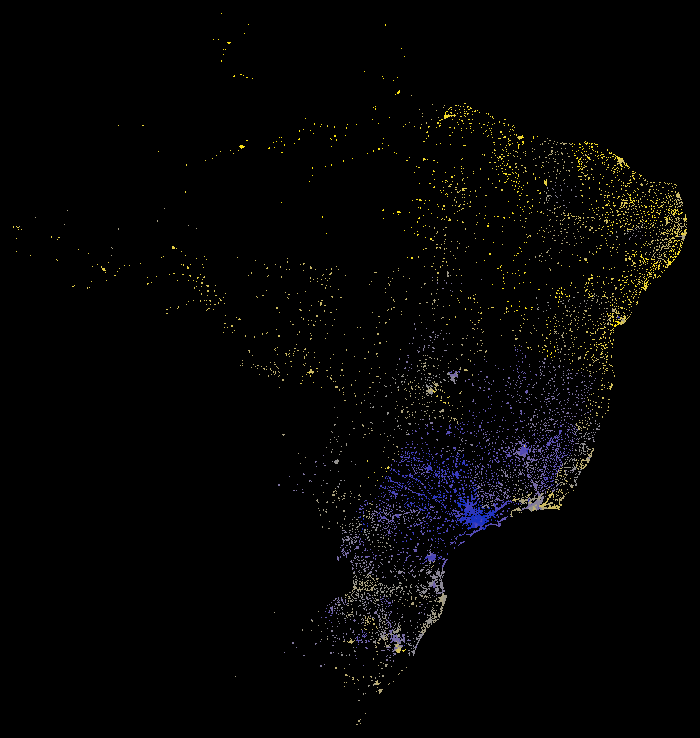

In [48]:

create_map(delivery_time, bjy, ds.mean(agg_name), 'avg_delivery_time_brazil')

La mappa ci indica che (come ci aspettavamo), il delivery cost è minore nelle grosse città e nelle zone densamente popolate.

Proviamo a concentrarci sullo stato di *Parana* (PR).

In [49]:
pr = filter_data('geolocation_state', 'PR').set_index('geolocation_zip_code_prefix_3_digits')
gp = orders.groupby('customer_zip_code_prefix_3_digits')['actual_delivery_time'].mean().to_frame()
pr_delivery_time = pr.join(gp)
pr_delivery_time[agg_name] = pr_delivery_time['actual_delivery_time']

In [50]:
plot_map(pr_delivery_time, 'Orders Average Delivery Time in Parana State (days)', ds.mean(agg_name), agg_name, cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y avg_delivery_time)

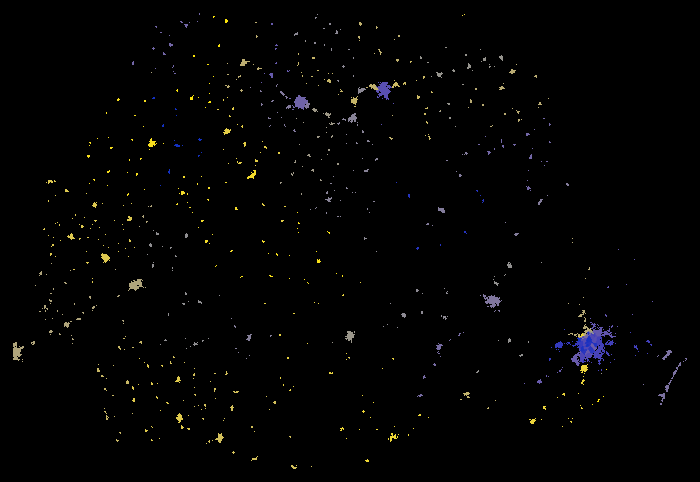

In [51]:
create_map(pr_delivery_time, bjy, ds.mean(agg_name), 'avg_delivery_time_pr')

# Interesting point about Brazilian Suburbs
A differenza di altre nazioni, in Brasile le zone generalmente più ricche delle città sono vicine alle periferie, mentre i sobborghi sono noti per gli alti tassi di povertà e violenza.

Vediamo come esempio *Rio de Janeiro*.

In [52]:
riodejaneiro = filter_data('geolocation_city', 'rio de janeiro').set_index('geolocation_zip_code_prefix_3_digits')
gp = orders.groupby('customer_zip_code_prefix_3_digits')['actual_delivery_time'].mean().to_frame()
rj_delivery_time = riodejaneiro.join(gp)
rj_delivery_time[agg_name] = rj_delivery_time['actual_delivery_time']

In [53]:
plot_map(rj_delivery_time, 'Orders Average Delivery Time in Rio de Janeiro (days)', ds.mean(agg_name), agg_name, cmap=bjy)

:DynamicMap   []
   :Overlay
      .WMTS.I     :WMTS   [Longitude,Latitude]
      .RGB.I      :RGB   [x,y]   (R,G,B,A)
      .QuadMesh.I :QuadMesh   [x,y]   (x_y avg_delivery_time)

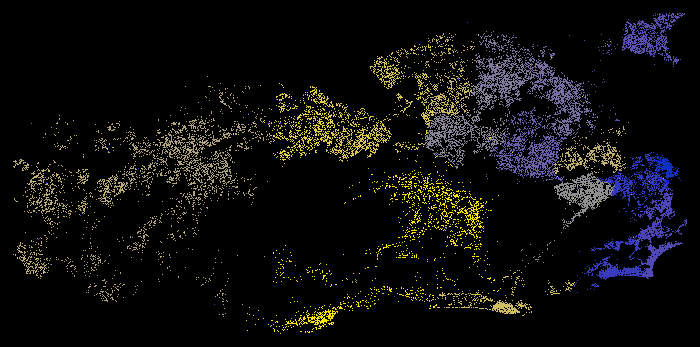

In [54]:
create_map(rj_delivery_time, bjy, ds.mean(agg_name), 'rio_de_janeiro_avg_delivery_time')

Esiste una forte differenza (di 5 giorni) per le consegne tra le zone ricche e le zone povere.